# Import Libraries

In [1]:
pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [221]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams["figure.figsize"] = (10,5)
plt.rcParams["figure.dpi"] = 250
import nltk 
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from wordcloud import WordCloud
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# Load the dataset

In [225]:
import csv

def clean_csv(input_filepath, output_filepath):
    with open(input_filepath, 'r', encoding='latin-1') as infile, open(output_filepath, 'w', encoding='latin-1', newline='') as outfile:
        reader = csv.reader(infile)
        writer = csv.writer(outfile)
        
        for row in reader:
            # Perform any necessary cleaning here
            # Example: Removing extra quotes or correcting delimiters
            cleaned_row = [field.replace('"', '') for field in row]
            writer.writerow(cleaned_row)

# Clean the CSV file
input_filepath = "blogs.csv.crdownload"
output_filepath = "cleaned_blogs.csv"
clean_csv(input_filepath, output_filepath)

# Read the cleaned CSV file
try:
    df = pd.read_csv(output_filepath, encoding='latin-1')
    print(df.head())
except Exception as e:
    print(f"Error: {e}")

                                                Data       Labels
0  Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...  alt.atheism
1  Newsgroups: alt.atheism\nPath: cantaloupe.srv....  alt.atheism
2  Path: cantaloupe.srv.cs.cmu.edu!das-news.harva...  alt.atheism
3  Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...  alt.atheism
4  Xref: cantaloupe.srv.cs.cmu.edu alt.atheism:53...  alt.atheism


In [226]:
df

,Data,Labels
0,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
1,Newsgroups: alt.atheism\nPath: cantaloupe.srv....,alt.atheism
2,Path: cantaloupe.srv.cs.cmu.edu!das-news.harva...,alt.atheism
3,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
4,Xref: cantaloupe.srv.cs.cmu.edu alt.atheism:53...,alt.atheism
...,...,...
1973,Path: cantaloupe.srv.cs.cmu.edu!crabapple.srv....,talk.religion.misc
1974,Newsgroups: talk.religion.misc\nPath: cantalou...,talk.religion.misc
1975,Newsgroups: talk.religion.misc\nPath: cantalou...,talk.religion.misc
1976,Xref: cantaloupe.srv.cs.cmu.edu alt.conspiracy...,talk.religion.misc


<Axes: xlabel='count', ylabel='Labels'>

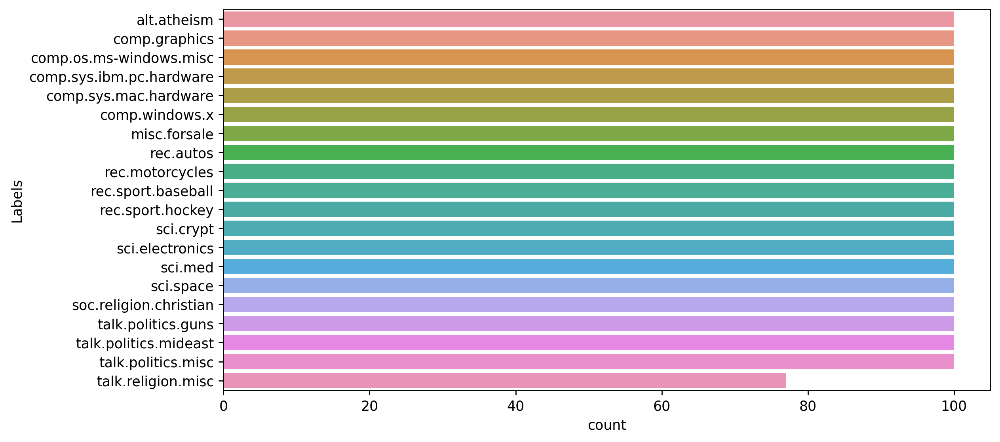

In [227]:
sns.countplot(y = df['Labels'])

In [228]:
df.describe()

,Data,Labels
count,1978,1977
unique,1978,20
top,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
freq,1,100


In [229]:
df.isnull().sum()

Data      0
Labels    1
dtype: int64

In [230]:
df = df.drop(index=1977)

In [231]:
df

,Data,Labels
0,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
1,Newsgroups: alt.atheism\nPath: cantaloupe.srv....,alt.atheism
2,Path: cantaloupe.srv.cs.cmu.edu!das-news.harva...,alt.atheism
3,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
4,Xref: cantaloupe.srv.cs.cmu.edu alt.atheism:53...,alt.atheism
...,...,...
1972,Xref: cantaloupe.srv.cs.cmu.edu alt.atheism:53...,talk.religion.misc
1973,Path: cantaloupe.srv.cs.cmu.edu!crabapple.srv....,talk.religion.misc
1974,Newsgroups: talk.religion.misc\nPath: cantalou...,talk.religion.misc
1975,Newsgroups: talk.religion.misc\nPath: cantalou...,talk.religion.misc


In [232]:
df.isnull().sum()

Data      0
Labels    0
dtype: int64

In [233]:
df.duplicated().sum()

0

In [234]:
df.head()

,Data,Labels
0,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
1,Newsgroups: alt.atheism\nPath: cantaloupe.srv....,alt.atheism
2,Path: cantaloupe.srv.cs.cmu.edu!das-news.harva...,alt.atheism
3,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
4,Xref: cantaloupe.srv.cs.cmu.edu alt.atheism:53...,alt.atheism


# Labelencoding for the target columns

In [235]:
from sklearn.preprocessing import LabelEncoder

In [236]:
labelencoder = LabelEncoder()

In [237]:
df["Target"] = labelencoder.fit_transform(df["Labels"])

In [238]:
df

,Data,Labels,Target
0,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism,0
1,Newsgroups: alt.atheism\nPath: cantaloupe.srv....,alt.atheism,0
2,Path: cantaloupe.srv.cs.cmu.edu!das-news.harva...,alt.atheism,0
3,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism,0
4,Xref: cantaloupe.srv.cs.cmu.edu alt.atheism:53...,alt.atheism,0
...,...,...,...
1972,Xref: cantaloupe.srv.cs.cmu.edu alt.atheism:53...,talk.religion.misc,19
1973,Path: cantaloupe.srv.cs.cmu.edu!crabapple.srv....,talk.religion.misc,19
1974,Newsgroups: talk.religion.misc\nPath: cantalou...,talk.religion.misc,19
1975,Newsgroups: talk.religion.misc\nPath: cantalou...,talk.religion.misc,19


In [239]:
df["Target"].value_counts()

0     100
1     100
18    100
17    100
16    100
15    100
14    100
13    100
12    100
11    100
10    100
9     100
8     100
7     100
6     100
5     100
4     100
3     100
2     100
19     77
Name: Target, dtype: int64

In [240]:
df["Target"].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19])

# Text cleaning
1. Remove unwanted characters
2. Text normalization
3. Tokenization
4. lemmatization
5. Join the text

In [241]:
lemma = WordNetLemmatizer()

In [242]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\vimal\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [243]:
    corpus = []

    for i in range(len(df)):
        msg = re.sub('[^a-zA-Z]',' ',df['Data'][i]) #Clean the text
        msg = msg.lower() #Text normalization
        msg = msg.split() #Word tokenize
        msg = [lemma.lemmatize(i) for i in msg if i not in stopwords.words('english')] #Lemmatization
        msg = ' '.join(msg) # Join sentences
        corpus.append(msg)

In [244]:
corpus

['path cantaloupe srv c cmu edu magnesium club cc cmu edu news sei cmu edu ci ohio state edu zaphod mp ohio state edu howland reston an net agate doc ic ac uk uknet mcsun germany eu net thoth mchp sni de horus ap mchp sni de frank frank uucp frank dwyer newsgroups alt atheism subject islamic genocide date apr gmt organization siemens nixdorf ag line distribution world message id r vej k horus ap mchp sni de reference r qe fido asd sgi com r ubl bd horus ap mchp sni de r ek uo fido asd sgi com nntp posting host ap mchp sni de article r ek uo fido asd sgi com livesey solntze wpd sgi com jon livesey writes article r ubl bd horus ap mchp sni de frank uucp frank dwyer writes article r qe fido asd sgi com livesey solntze wpd sgi com jon livesey writes noting particular society case mainland uk religously motivated murder murder kind say little whether inter religion murder elsewhere religiously motivated allows one conclude nothing inherent religion matter catholicism protestantism motivates

# Model Building

# Feature Extraction

# Tf-IDF

In [245]:
df

,Data,Labels,Target
0,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism,0
1,Newsgroups: alt.atheism\nPath: cantaloupe.srv....,alt.atheism,0
2,Path: cantaloupe.srv.cs.cmu.edu!das-news.harva...,alt.atheism,0
3,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism,0
4,Xref: cantaloupe.srv.cs.cmu.edu alt.atheism:53...,alt.atheism,0
...,...,...,...
1972,Xref: cantaloupe.srv.cs.cmu.edu alt.atheism:53...,talk.religion.misc,19
1973,Path: cantaloupe.srv.cs.cmu.edu!crabapple.srv....,talk.religion.misc,19
1974,Newsgroups: talk.religion.misc\nPath: cantalou...,talk.religion.misc,19
1975,Newsgroups: talk.religion.misc\nPath: cantalou...,talk.religion.misc,19


In [246]:
y = df['Target']
y

0        0
1        0
2        0
3        0
4        0
        ..
1972    19
1973    19
1974    19
1975    19
1976    19
Name: Target, Length: 1977, dtype: int32

In [247]:
tf = TfidfVectorizer()

x_data = tf.fit_transform(corpus)
x_data.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [248]:
pd.DataFrame(x_data.toarray(), columns=tf.get_feature_names_out()).head()

,aa,aaa,aaaaarrrrgh,aaaca,aafkhthmj,aalternate,aaltonen,aam,aan,aangegeven,aantal,aap,aaplay,aardvark,aargh,aarhus,aarnet,aaron,aaronc,aaroundpluto,aau,aauwpiugyv,aavi,aawz,ab,abacus,abad,abandon,abandonded,abandoned,abandoning,abate,abbey,abbie,abbot,abbreviation,abc,abcd,abdkw,abdul,abdulla,abdullah,abel,aber,aberdeen,aberration,aberystwyth,abfp,abh,abhorrant,abhors,abideth,abiding,abilene,ability,abingdon,abiogenesis,abj,abject,able,abm,abn,abner,abnormality,abo,abolish,abolished,abolishing,abomination,aboriginal,abort,aborted,abortion,abortionist,abound,abouts,abovew,abpsoft,abqhh,abraham,abrash,abraxis,abrg,abridged,abridgement,abridging,abridgment,abroad,abrogate,abrogated,abrogating,abrogator,abruno,abruptly,absence,absent,absentee,absolut,absolute,absolutely,absolutist,absolutley,absorb,absorbed,absorber,absorbing,absorbtion,abstain,abstention,abstinence,abstract,abstraction,absurd,absurdity,abt,abu,abundance,abundantly,abuse,abused,abuser,abusing,abusive,abysmal,abyss,ac,acad,academia,academic,academically,academy,acadiau,acadien,acc,acceding,accel,accelerate,accelerated,accelerates,acceleration,accelerator,accelleration,accellerator,accented,accept,acceptable,acceptably,acceptance,accepted,acceptible,accepting,accepts,accesible,access,accessable,accessed,accessible,accessory,accident,accidental,accidentally,accidently,accomazzi,accommodate,accommodation,accomodate,accomodating,accompanied,accompany,accompanying,accomplish,accomplished,accomplishes,accomplishing,accomplishment,accor,accord,accordance,accorded,according,accordingly,account,accountability,accountable,accounted,accounting,accpeting,accredit,accreditation,accredited,accreted,accretie,accretieschijven,accton,accucorp,accukey,accumulate,accumulated,accumulates,accumulating,accuracy,accurate,accurately,accusation,accuse,accused,accusing,accusors,accustomed,accuusation,acd,ace,acer,acessing,acetaminophen,acetate,acetone,acetyl,acheive,acheived,achieve,achieved,achievement,achkar,achmeds,acid,acidophilus,acis,ack,acker,acknowledge,acknowledged,acknowledgement,acknowledges,acknowledging,acknowledgment,acknowleged,aclu,acm,acme,acns,acollins,acooney,acooneyc,acooper,acorn,acoustic,acpub,acquaintace,acquaintance,acquiescence,acquire,acquired,acquires,acquiring,acquisition,acquitted,acre,acronym,across,acrv,acsnet,acsu,act,acted,acting,actinide,action,activate,activated,activating,activation,active,actively,activism,activist,activiteiten,activity,actix,acton,actor,actrix,actual,actuality,actually,actuarial,acusd,acute,acuuracy,acvax,acvvyrhg,acw,acx,ad,ada,adagio,adam,adamant,adamsj,adamski,adana,adapt,adaptabtion,adaptation,adaptec,adapted,adapter,adaptive,adaptor,adasoft,adavantage,adb,adbucted,adc,adcom,add,adda,addario,added,addendum,addict,addicted,addiction,addictive,adding,addison,additinol,addition,additional,additionally,additive,addr,address,addressdecoder,addressed,addressing,addrs,ade,adelaide,adelphi,adenocarcinoma,adept,adequate,adequately,adf,adg,adhere,adherence,adheres,adhesive,adi,adirondack,adjacent,adjective,adjucnt,adjust,adjustable,adjusted,adjusting,adjustment,adjusts,adjuvant,adl,adlib,adm,admd,admin,adminis,administer,administered,administr,administration,administrative,administrator,adminstration,adminstrator,admiral,admiration,admire,admired,admirer,admiring,admissible,admission,admistration,admit,admits,admitted,admittedly,admitting,admonish,admonition,adn,adnausium,adobe,adolescent,adolf,adolfo,adonais,adopt,adopted,adopting,adp,adpeters,adpt,adren,adrenalin,adrenaline,adress,adrg,adriaansen,adrian,adriatic,adsorbed,adsr,adt,adulation,adult,adultary,adulterant,adultery,advacned,advance,advanced,advancement,advancing,advantage,advent,adventist,adventure,adversary,adverse,adversely,advert,advertise,advertised,advertisement,advertiser,advertising,advice,advirtisement,advise,advised,adviser,advising,advisor,advisory,advocacy,advocate,advocated,advocating,advocation,advtech,advthanksance,adx,ady,ae,aegean,aej,ael,aem,aeo,aep,aeqxn,aerial,ae

In [249]:
pd.set_option('display.max_columns',None)

In [250]:
pd.DataFrame(x_data.toarray(), columns=tf.get_feature_names_out()).head()

,aa,aaa,aaaaarrrrgh,aaaca,aafkhthmj,aalternate,aaltonen,aam,aan,aangegeven,aantal,aap,aaplay,aardvark,aargh,aarhus,aarnet,aaron,aaronc,aaroundpluto,aau,aauwpiugyv,aavi,aawz,ab,abacus,abad,abandon,abandonded,abandoned,abandoning,abate,abbey,abbie,abbot,abbreviation,abc,abcd,abdkw,abdul,abdulla,abdullah,abel,aber,aberdeen,aberration,aberystwyth,abfp,abh,abhorrant,abhors,abideth,abiding,abilene,ability,abingdon,abiogenesis,abj,abject,able,abm,abn,abner,abnormality,abo,abolish,abolished,abolishing,abomination,aboriginal,abort,aborted,abortion,abortionist,abound,abouts,abovew,abpsoft,abqhh,abraham,abrash,abraxis,abrg,abridged,abridgement,abridging,abridgment,abroad,abrogate,abrogated,abrogating,abrogator,abruno,abruptly,absence,absent,absentee,absolut,absolute,absolutely,absolutist,absolutley,absorb,absorbed,absorber,absorbing,absorbtion,abstain,abstention,abstinence,abstract,abstraction,absurd,absurdity,abt,abu,abundance,abundantly,abuse,abused,abuser,abusing,abusive,abysmal,abyss,ac,acad,academia,academic,academically,academy,acadiau,acadien,acc,acceding,accel,accelerate,accelerated,accelerates,acceleration,accelerator,accelleration,accellerator,accented,accept,acceptable,acceptably,acceptance,accepted,acceptible,accepting,accepts,accesible,access,accessable,accessed,accessible,accessory,accident,accidental,accidentally,accidently,accomazzi,accommodate,accommodation,accomodate,accomodating,accompanied,accompany,accompanying,accomplish,accomplished,accomplishes,accomplishing,accomplishment,accor,accord,accordance,accorded,according,accordingly,account,accountability,accountable,accounted,accounting,accpeting,accredit,accreditation,accredited,accreted,accretie,accretieschijven,accton,accucorp,accukey,accumulate,accumulated,accumulates,accumulating,accuracy,accurate,accurately,accusation,accuse,accused,accusing,accusors,accustomed,accuusation,acd,ace,acer,acessing,acetaminophen,acetate,acetone,acetyl,acheive,acheived,achieve,achieved,achievement,achkar,achmeds,acid,acidophilus,acis,ack,acker,acknowledge,acknowledged,acknowledgement,acknowledges,acknowledging,acknowledgment,acknowleged,aclu,acm,acme,acns,acollins,acooney,acooneyc,acooper,acorn,acoustic,acpub,acquaintace,acquaintance,acquiescence,acquire,acquired,acquires,acquiring,acquisition,acquitted,acre,acronym,across,acrv,acsnet,acsu,act,acted,acting,actinide,action,activate,activated,activating,activation,active,actively,activism,activist,activiteiten,activity,actix,acton,actor,actrix,actual,actuality,actually,actuarial,acusd,acute,acuuracy,acvax,acvvyrhg,acw,acx,ad,ada,adagio,adam,adamant,adamsj,adamski,adana,adapt,adaptabtion,adaptation,adaptec,adapted,adapter,adaptive,adaptor,adasoft,adavantage,adb,adbucted,adc,adcom,add,adda,addario,added,addendum,addict,addicted,addiction,addictive,adding,addison,additinol,addition,additional,additionally,additive,addr,address,addressdecoder,addressed,addressing,addrs,ade,adelaide,adelphi,adenocarcinoma,adept,adequate,adequately,adf,adg,adhere,adherence,adheres,adhesive,adi,adirondack,adjacent,adjective,adjucnt,adjust,adjustable,adjusted,adjusting,adjustment,adjusts,adjuvant,adl,adlib,adm,admd,admin,adminis,administer,administered,administr,administration,administrative,administrator,adminstration,adminstrator,admiral,admiration,admire,admired,admirer,admiring,admissible,admission,admistration,admit,admits,admitted,admittedly,admitting,admonish,admonition,adn,adnausium,adobe,adolescent,adolf,adolfo,adonais,adopt,adopted,adopting,adp,adpeters,adpt,adren,adrenalin,adrenaline,adress,adrg,adriaansen,adrian,adriatic,adsorbed,adsr,adt,adulation,adult,adultary,adulterant,adultery,advacned,advance,advanced,advancement,advancing,advantage,advent,adventist,adventure,adversary,adverse,adversely,advert,advertise,advertised,advertisement,advertiser,advertising,advice,advirtisement,advise,advised,adviser,advising,advisor,advisory,advocacy,advocate,advocated,advocating,advocation,advtech,advthanksance,adx,ady,ae,aegean,aej,ael,aem,aeo,aep,aeqxn,aerial,ae

In [251]:
x_data = x_data.toarray()

In [252]:
xtrain,xtest,ytrain,ytest = train_test_split(x_data,y,test_size=0.2, random_state=42)

In [253]:
xtrain

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [254]:
xtest

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [255]:
ytrain

1794    17
1328    13
332      3
1341    13
583      5
        ..
1130    11
1294    12
860      8
1459    14
1126    11
Name: Target, Length: 1581, dtype: int32

In [256]:
ytest

1827    18
1889    18
678      6
351      3
1105    11
        ..
71       0
764      7
259      2
51       0
198      1
Name: Target, Length: 396, dtype: int32

In [257]:
nb = MultinomialNB()
nb.fit(xtrain,ytrain)
ypred = nb.predict(xtest)

print(f"Train Accuracy: {nb.score(xtrain,ytrain)}\nTest Accuracy: {nb.score(xtest,ytest)}")

Train Accuracy: 0.9772296015180265
Test Accuracy: 0.8005050505050505
